# practice in Python: colors, Morfologia and Compressão

chapters of reference (Gonzalez & Woods, 4ª Ed.):- chapter 6: Processamento of images Coloridas- chapter 9: Processamento Morfológico of images- chapter 8: Compressão of images

first, We will import the libraries that We will use to the long of this practice and load some images of example.

Imagens de exemplo carregadas.


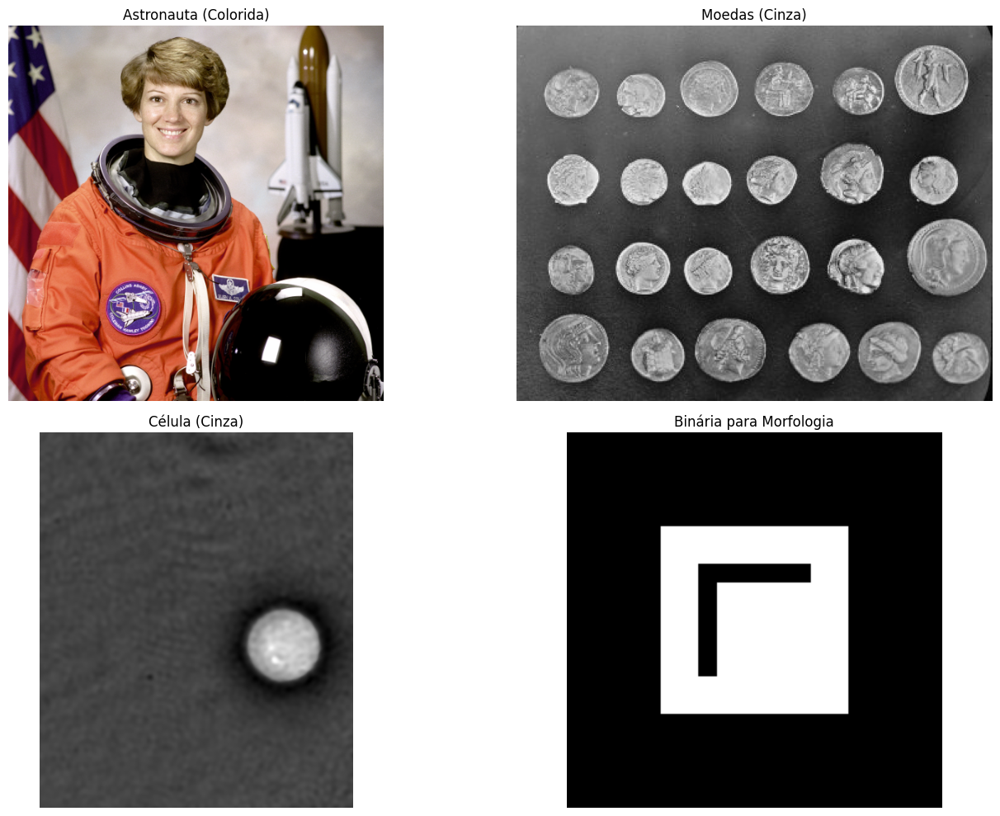

In [ ]:
# --- imports Necessárias --- import numpy as np import matplotlib.pyplot as plt from skimage import date, img_as_float, img_as_ubyte, io from skimage.color import rgb2gray, rgb2hsv, hsv2rgb, label2rgb from skimage.exposure import rescale_intensity, histogram import skimage.morphology from skimage.morphology import binary_dilation, binary_erosion, disk, square, binary_opening, binary_closing, white_tophat, black_tophat from skimage.measure import label, regionprops from skimage.transform import resize from scipy import ndimage import pywt # to Wavelets (chapter 8, if abordado in compressão) from PIL import Image # to save e load images, útil in compressão import os  # --- function Auxiliar of Plotagem --- def plot_comparison(original, G_filtered, filter_name, cmap_original='gray', cmap_filtered='gray'):  fig, axes = plt.subplots(ncols=2, figsize=(10, 5), sharex=True, sharey=True)  ax = axes.ravel()  ax[0].imshow(original, cmap=cmap_original)  ax[0].set_title('Original')  ax[0].axis('off')  ax[1].imshow(G_filtered, cmap=cmap_filtered)  ax[1].set_title(filter_name)  ax[1].axis('off')  plt.tight_layout()  plt.show()  def plot_channels(rgb_image, r_channel, g_channel, b_channel):  fig, axes = plt.subplots(1, 4, figsize=(20, 5))  axes[0].imshow(rgb_image); axes[0].set_title('Original Colorida'); axes[0].axis('off')  axes[1].imshow(r_channel, cmap='Reds_r'); axes[1].set_title('Canal Vermelho (R)'); axes[1].axis('off')  axes[2].imshow(g_channel, cmap='Greens_r'); axes[2].set_title('Canal Verde (G)'); axes[2].axis('off')  axes[3].imshow(b_channel, cmap='Blues_r'); axes[3].set_title('Canal Azul (B)'); axes[3].axis('off')  plt.tight_layout()  plt.show()  def plot_many_images(images, titles, rows, cols, cmaps=None, figsize=(15,10)):  fig, axes = plt.subplots(rows, cols, figsize=figsize, squeeze=False)  axes_flat = axes.ravel()  if cmaps is None: cmaps_list = ['gray'] * len(images)  elif isinstance(cmaps, str): cmaps_list = [cmaps] * len(images)  else:  cmaps_list = list(cmaps)  if len(cmaps_list) < len(images): cmaps_list.extend(['gray']*(len(images)-len(cmaps_list)))   for i in range(len(axes_flat)):  if i < len(images):  img, title, cmap_val = images[i], titles[i], cmaps_list[i]  axes_flat[i].imshow(img, cmap=cmap_val if img.ndim==2 or img.shape[-1]!=3 else None)  axes_flat[i].set_title(title)  axes_flat[i].axis('off')  else:  axes_flat[i].axis('off')  plt.tight_layout()  plt.show()   # --- load images of example --- try:  astro_color = date.astronaut() # image colorida  moedas_gray = date.coins() # image in tons of gray  celula_gray = date.cell() # Outra image in tons of gray  # # to examples of morfologia, We will create the image binary simple  binary_morph = np.zeros((200, 200), dtype=bool)  binary_morph[50:150, 50:150] = True  binary_morph[70:130, 70:80] = False  binary_morph[70:80, 70:130] = False # add alguma complexity  print("images de example carregadas.")  plot_many_images([astro_color, moedas_gray, celula_gray, binary_morph],  ["Astronauta (Colorida)", "coins (gray)", "Célula (gray)", "Binária to Morfologia"],  2, 2, cmaps=[None, 'gray', 'gray', 'gray']) except Exception as e:  print(f"error ao to load images de example: {e}")  print("by favor, verifique sua connection or a disponibilidade of date of skimage.")

this bloco should load the libraries without errors and display the four images of example that We will use: "Astronauta" (colorida), "coins" (tons of gray), "cell" (tons of gray) and the image binary synthetic to tests of morfologia.

## module 1: chapter 6 - Processamento of images Coloridasconcepts important: models of color (RGB, HSV/HSI), Pseudocolor, Processamento of images Coloridas.

1.1. models of color (RGB and HSV/HSI)

images coloridas are generally representadas in the model RGB (Vermelho, Verde, Azul). others models the HSV (Matiz, Saturação, value) or HSI (Matiz, Saturação, Intensidade) are useful because separam the information of color (matiz, saturação) of the information of intensidade (brilho), What is more intuitivo to the perception humana and to certas operações of processamento.

the code Funciona (RGB):1. the image `astro_color` already is in the format RGB.2. Extraímos the channels R, G, B separadamente indexando the last axis of the array of the image.3. we visualize the image colorida original and each one of the your channels the images in tons of gray (where the brilho represents the intensidade daquela color primary).the code Funciona (HSV):1. `rgb2hsv(astro_color)`: Converte the image RGB to the model HSV. the result is the image 3D where the channels are H, S, V.2. the channels H, S, V are extraídos.3. `hsv2rgb(img_hsv)`: Converte the image HSV of return to RGB for visualization.4. we visualize the channels H, S, V and the image reconstruída the partir of the HSV.


--- Módulo 1.1.1: Modelo RGB ---


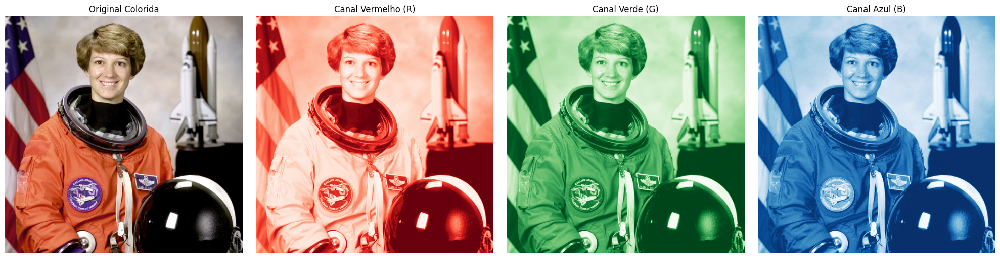


--- Módulo 1.1.2: Modelo HSV ---


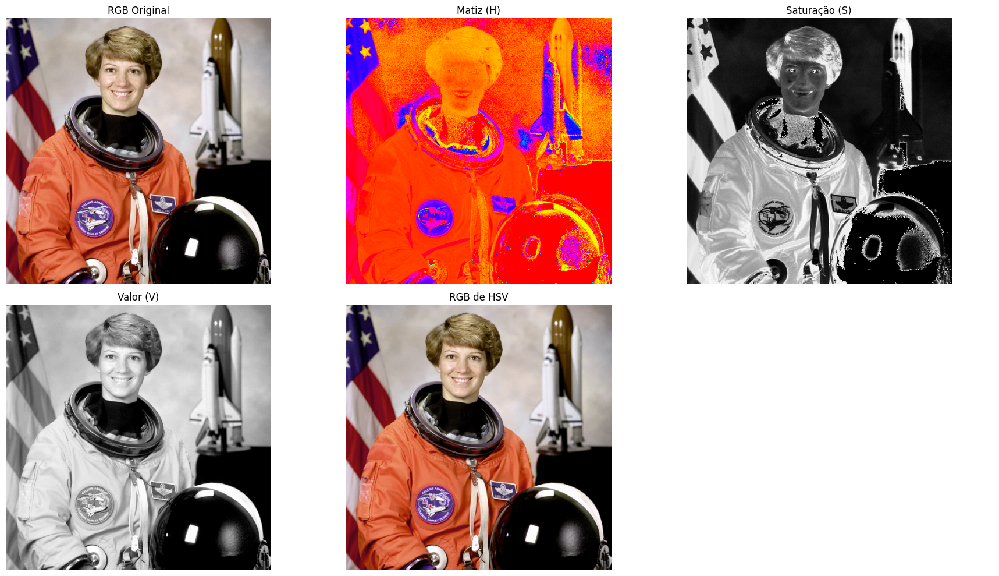

In [ ]:
# 1.1.1 model RGB print("\n--- module 1.1.1: model RGB ---") if 'astro_color' in globals():  R_channel = astro_color[:,:,0]  G_channel = astro_color[:,:,1]  B_channel = astro_color[:,:,2]  plot_channels(astro_color, R_channel, G_channel, B_channel) else:  print("image 'astro_color' não carregada. Pule este example.")  # 1.1.2 model HSV (Hue, Saturation, Value) # HSI (Hue, Saturation, Intensity) é muito similar. skimage.color uses HSV. print("\n--- module 1.1.2: model HSV ---") if 'astro_color' in globals():  img_hsv = rgb2hsv(astro_color)  H_channel_hsv = img_hsv[:,:,0] # Matiz (Hue)  S_channel_hsv = img_hsv[:,:,1] # Saturação (Saturation)  V_channel_hsv = img_hsv[:,:,2] # value (Value / Brilho)   # # to visualize the canais H, S, V individualmente the images in tons of gray  # # É important notar that the canal H (matiz) é cíclico (angle),  # # then your visualização direct in tons of gray can não be intuitiva to todas the colors.   # # Reconstruir to RGB to check  img_reconstruida_hsv = hsv2rgb(img_hsv)  # # Lidar with possíveis small errors of precision that can levar the values outside of [0,1]  img_reconstruida_hsv = np.clip(img_reconstruida_hsv, 0, 1)    plot_many_images([astro_color, H_channel_hsv, S_channel_hsv, V_channel_hsv, img_reconstruida_hsv],  ["RGB Original", "Matiz (H)", "Saturação (S)", "value (V)", "RGB de HSV"],  rows=2, cols=3, figsize=(18,10),  cmaps=['gray','hsv','gray','gray', None]) # use cmap 'hsv' to the canal H else:  print("image 'astro_color' não carregada. Pule este example.")

Interpretando the results (RGB and HSV):- Channels RGB: Observe the different parts of the image "Astronauta" are representadas in each channel. the capacete branco will have high intensidade in all the three channels. the bandeira of the EUA will show high intensidade in the channel vermelho to the listras vermelhas, in the azul to the fundo azul, etc.Channels HSV:- Matiz (H): represents the "color pura" (ex: vermelho, amarelo, verde, ciano, azul, magenta). is one angle (0-360 degrees, normalizado to 0-1 in skimage). the mapa of colors 'hsv' ajuda the visualize This ciclicamente.- Saturação (S): represents the "pureza" of the color (quão diluída it is with branco). 0 = gray, 1 = color totally saturada.- value (V) / Intensidade (I): represents the brilho of the color. 0 = preto, 1 = color more bright. the channel V if assemelha the version in tons of gray of the image.- RGB of HSV: the image reconstruída the partir of the HSV should be idêntica to the original.

exercise fast (models of color):1. in the model HSV, modifique the channel of Saturação (`S_channel_hsv`). by example, multiplique-the by 0.5 (to dessaturar) or Try aumentá-lo (caution to não pass of 1.0, use `np.clip`). Converta of return to RGB and visualize. the that aconteceu?2. Faça the same to the channel of value (`_channel_hsv`). Multiplique by 0.5 (escurecer) or 1.5 (clarear, seguido of `np.clip(..., 0, 1)`). Converta of return to RGB and visualize.

1.2. Processamento of Pseudocor

Pseudocor is the technique of atribuir colors the image in tons of gray based in their levels of intensidade. This can ajudar the realçar characteristics that não would be easily perceptíveis in tons of gray. the shape common is the "fatiamento of densidade" (intensity slicing).

the code Funciona:1. uses the image in tons of gray `moedas_gray`.2. Fatiamento of Intensidade: the image is dividida in várias "fatias" of intensidade based in limiares.3. attribution of colors: the each fatia of intensidade is atribuída the color specific.- creates-if the image colorida empty (`img_pseudocor`).- to each fatia, the pixels of the original image that caem naquela fatia recebem the color designada in the channels R, G, B of the image `img_pseudocor`.4. visualizes the original image and the image with pseudocor.

In [ ]:
# --- imports Necessárias --- import numpy as np import matplotlib.pyplot as plt from skimage import date, img_as_float, img_as_ubyte, transform, exposure, util, filters, morphology from scipy import ndimage from numpy.fft import fft2, ifft2, fftshift, ifftshift # to the Bloco 4 of the practice import time import cv2 # to draw círculos in the task 1.3  # --- function Auxiliar to plot Múltiplas images (CORRIGIDA) --- def plot_images(images, titles, cmaps=None, rows=1, cols=None, figsize=(15,5)):  num_images = len(images)  if cols is None:  cols = (num_images + rows - 1) // rows   fig, axes = plt.subplots(rows, cols, figsize=figsize, squeeze=False) # squeeze=False garante that axes é always 2D   axes_flat = axes.ravel()   if cmaps is None:  cmaps_list = ['gray'] * num_images  elif isinstance(cmaps, str):  cmaps_list = [cmaps] * num_images  else:  cmaps_list = list(cmaps)  if len(cmaps_list) < num_images:  cmaps_list.extend(['gray'] * (num_images - len(cmaps_list)))   for i in range(len(axes_flat)):  if i < num_images:  img = images[i]  title = titles[i]  current_cmap = cmaps_list[i]   axes_flat[i].imshow(img, cmap=current_cmap if img.ndim == 2 else None)  axes_flat[i].set_title(title)  axes_flat[i].axis('off')  else:  axes_flat[i].axis('off') # Desliga axes extras   plt.tight_layout()  plt.show()  # --- load image Médica --- try:  brain_volume = date.brain()  if brain_volume.ndim == 3:  slice_index = brain_volume.shape[0] // 2  image_gray_orig = brain_volume[slice_index, :, :]  elif brain_volume.ndim == 2:  image_gray_orig = brain_volume  slice_index = "N/A (image 2D)"  else:  raise ValueError("format de image 'brain' não esperado.")  print(f"image 'brain' (fatia {slice_index if brain_volume.ndim == 3 else ''}) carregada.") except Exception as e:  print(f"error ao to load 'brain': {e}. Usando 'camera' as fallback.")  image_gray_orig = date.camera()  # ESTAS are the variable GLOBAIS to the practice image_float_g = img_as_float(image_gray_orig.copy()) image_ubyte_g = img_as_ubyte(image_gray_orig.copy()) M_g, N_g = image_float_g.shape # dimensions globais to the practice  # visualize the original image # plot_images([image_ubyte_g], ["image Médica Original to practice"], cmaps=['gray']) 

Imagem 'brain' (fatia 5) carregada.



--- Módulo 1.2: Pseudocor (Fatiamento de Densidade) ---


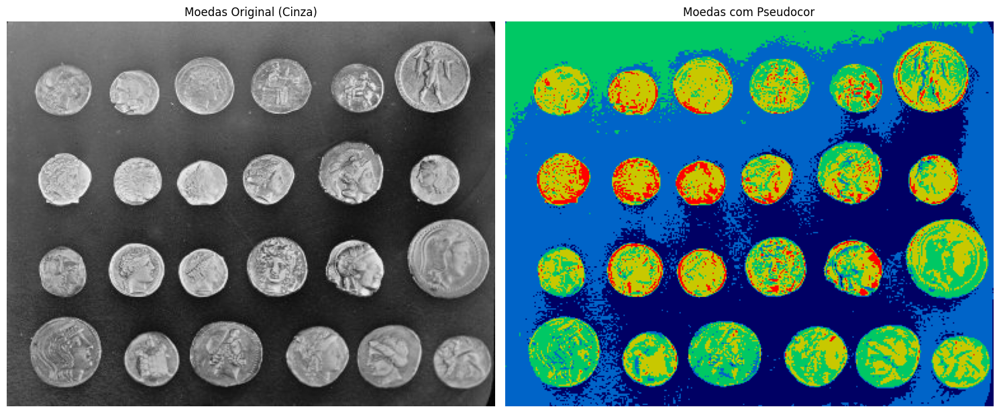

In [ ]:
# 1.2 Pseudocor print("\n--- module 1.2: Pseudocor (Fatiamento de Densidade) ---") if 'moedas_gray' in globals():  # # normalize to ubyte [0, 255] to fatiamento mais easy  moedas_ubyte = img_as_ubyte(moedas_gray)   # # defines ranges of intensidade e colors correspondentes  # # (valor_min_fatia, valor_max_fatia, [R, G, B])  # # values of color between 0 e 255  fatias_cores = [  (0, 50, [0, 0, 100]), # dark -> Azul dark  (51, 100, [0, 100, 200]), # -> Azul clear  (101, 150, [0, 200, 100]), # -> Verde  (151, 200, [200, 200, 0]), # -> Amarelo  (201, 255, [255, 0, 0]) # clear -> Vermelho  ]   # # create the image colorida empty (todos the pixels pretos)   img_pseudocor = np.zeros((M_g, N_g, 3), dtype=np.uint8) # Assumindo M_g,N_g of the image of cérebro, adjust if coins for different  # # use dimensions corretas of moedas_ubyte  rows_m, cols_m = moedas_ubyte.shape  img_pseudocor = np.zeros((rows_m, cols_m, 3), dtype=np.uint8)    for v_min, v_max, cor_rgb in fatias_cores:  mascara = (moedas_ubyte >= v_min) & (moedas_ubyte <= v_max)  img_pseudocor[mascara, 0] = cor_rgb[0] # Canal R  img_pseudocor[mascara, 1] = cor_rgb[1] # Canal G  img_pseudocor[mascara, 2] = cor_rgb[2] # Canal B   plot_many_images([moedas_ubyte, img_pseudocor],  ["coins Original (gray)", "coins with Pseudocolor"],  1, 2, cmaps=['gray', None]) else:  print("image 'moedas_gray' não carregada. Pule este example.")

Interpretando the results (Pseudocor):- coins original (gray): the image of input in tons of gray.- coins with Pseudocor: the image now is colorida. Each color represents the different range of intensities of the original image. This can make easier distinguish visually the coins based in their levels of gray original or destacar specific regions.

exercise fast (Pseudocor):1. Modifique the ranges of intensidade and/_ou the colors atribuídas in `fatias_cores`. by example, use less fatias, or use one esquema of colors different (ex: of azul to vermelho the one mapa of calor).2. Aplique the same princípio of pseudocor to the image `celula_gray`. Quais structures are realçadas?

1.3. Processamento of images Coloridas (Full-Color)

the processamento of images coloridas can be done of two maneiras main:1. Processamento by Channel: apply the technique of processamento in tons of gray the each channel of color (R, G, B) separadamente and after recombinar the channels.2. Processamento Vetorial: Tratar each pixel colorido the one vector in the espaço of color and apply operações vetoriais. Let's focar in the processamento by channel, applying the transformation of intensidade the each channel of the image colorida.

the code Funciona:1. uses the image `astro_color`.2. separation of Channels: the channels R, G, B are extraídos.3. transformation by Channel: the transformation (ex: correction gama) is aplicada the each channel individualmente.- `canal_transformado = exposure.adjust_gamma(channel, gamma_color)`4. Recombinação of Channels: the channels transformados are empilhados of return to formar the new image colorida using `np.stack`.5. Visualização of the original image and of the image processada.


--- Módulo 1.3: Processamento Full-Color (Gama por Canal) ---


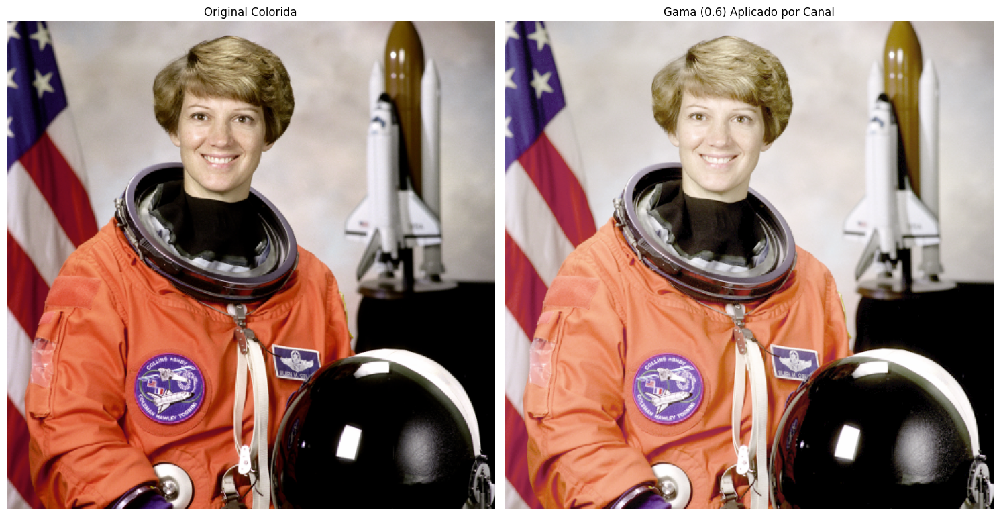

In [ ]:
# 1.3 Processamento of images Coloridas (Ex: transformation of Intensidade by Canal) print("\n--- module 1.3: Processamento Full-Color (Gama by Canal) ---") if 'astro_color' in globals():  # # apply correction gama the each canal  gamma_color_val = 0.6   # # separate canais  R_astro = astro_color[:,:,0]  G_astro = astro_color[:,:,1]  B_astro = astro_color[:,:,2]   # # apply gama the each canal (skimage.exposure.adjust_gamma opera in images [0,1] or ubyte)  # # if astro_color é ubyte, adjust_gamma mantém ubyte. if float, mantém float.  # # let's convert to float, apply, e convert of return if necessary, or use direct if for ubyte.  # # astro_color of skimage.date é ubyte.   R_gama = exposure.adjust_gamma(R_astro, gamma=gamma_color_val)  G_gama = exposure.adjust_gamma(G_astro, gamma=gamma_color_val)  B_gama = exposure.adjust_gamma(B_astro, gamma=gamma_color_val)   # # Recombinar the canais  # # np.stack creates one new axis. we need that the last axis whether the of the canais.  img_gama_color = np.stack((R_gama, G_gama, B_gama), axis=-1)   plot_many_images([astro_color, img_gama_color],  ["Original Colorida", f"Gama ({gamma_color_val}) Aplicado by Canal"],  1, 2, cmaps=[None, None]) else:  print("image 'astro_color' não carregada. Pule este example.")

Interpretando the results (Gama by Channel):- original Colorida: the image of input.- Gama applied by Channel: the image after the correction gama. the γ=0.6<1, the tons more dark in each channel were realçados (clareados). This can change the balance of colors overall of the image and your contraste.

exercise fast (Processamento Full-Color):1. Experimente different values of gamma_color_val (ex: 0.4, 1.0, 1.5). the balance of colors and the contraste of the image mudam?2. in vez of `adjust_gamma`, Try apply `exposure.equalize_hist` the each channel R, G, B of the image `astro_color` (convertida to ubyte if already não for). Recombine the channels. the result is visually agradável? Discuta Why the equalization of histogram independente by channel can levar the changes of color indesejadas. (tip: the equalization altera the distribution relative of the intensities in each channel of shape independente).

chapter 9 - Processamento Morfológico of imagesconcepts important: elements Estruturantes, Dilatação, Erosão, Abertura, closing, algorithms Morfológicos basic.Focaremos in images binary to simplicity of the concepts morfológicos basic

2.1. Preliminares and Operações Morfológicas basic: Dilatação and Erosão

the processamento morfológico lida with the geometria of characteristics of the image. the operações basic are dilatação and erosão, that use one small standard chamado element estruturante (EE) to sondar the image.- Dilatação: Expande or "engrossa" the objects brancos (foreground) in the image. one pixel of output is branco if qualquer pixel of the element estruturante sobreposto the it in the image of input cobrir one pixel branco.- Erosão: Encolhe or "afina" the objects brancos. one pixel of output is branco only if all the pixels of the element estruturante sobreposto the it in the image of input cobrirem pixels brancos.

the code Funciona:1. uses the image `binary_morph` (image binary synthetic).2. element Estruturante (EE):`morphology.disk(radius)`: creates a EE in shape of disco.`morphology.square(width)`: creates a EE square.3. Operações:`morphology.binary_dilation(image, selem=ee)`: Realiza the dilatação.`morphology.binary_erosion(image, selem=ee)`: Realiza the erosão.4. visualizes the original image, the EE, and the results of the dilatação and erosão.


--- Módulo 2.1: Dilatação e Erosão Binárias ---
Visualizando EEs e resultados da dilatação/erosão...


<ipython-input-13-15e61060d2d8>:12: FutureWarning: `square` is deprecated since version 0.25 and will be removed in version 0.27. Use `skimage.morphology.footprint_rectangle` instead.
  ee_quadrado_5_morph_c9 = square(5) # Quadrado 5x5


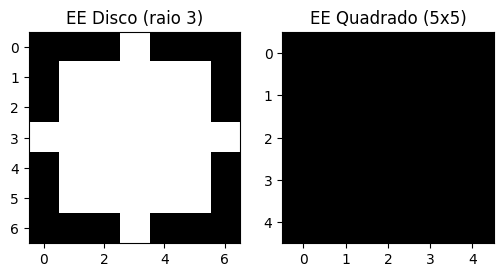

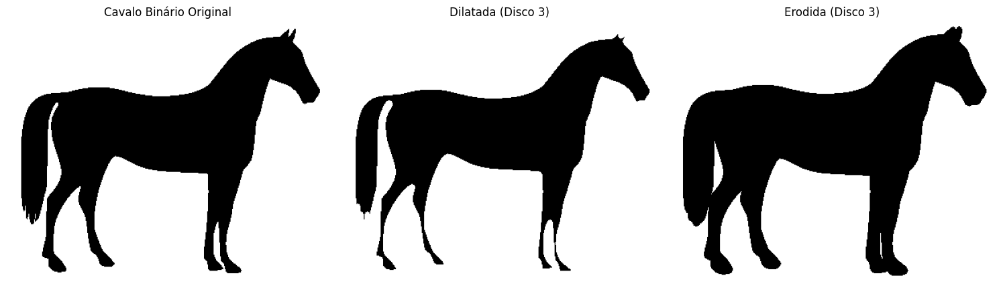

In [ ]:
# 2.1 Dilatação e Erosão print("\n--- module 2.1: Dilatação e Erosão Binárias ---")  horse_color = date.horse() # image binary (True/False) that can be usada to morfologia # convert cavalo to ubyte to consistency e operações morfológicas horse_binary = img_as_ubyte(horse_color) # Converte to 0 or 255 horse_binary = horse_binary > 128  if 'horse_binary' in globals():  # # elements Estruturantes (EE)  ee_disco_3_morph_c9 = disk(3) # Disco of raio 3  ee_quadrado_5_morph_c9 = square(5) # square 5x5   # # Dilatação  img_dilatada_cavalo_disco_c9 = binary_dilation(horse_binary, footprint=ee_disco_3_morph_c9)   # # Erosão  img_erodida_cavalo_disco_c9 = binary_erosion(horse_binary, footprint=ee_disco_3_morph_c9)   print("Visualizando EEs e results of dilatação/erosão...")  # # visualize EE  fig_ee_morph_c9, ax_ee_morph_c9 = plt.subplots(1,2, figsize=(6,3))  ax_ee_morph_c9[0].imshow(ee_disco_3_morph_c9, cmap='gray', interpolation='nearest'); ax_ee_morph_c9[0].set_title('EE Disco (raio 3)')  ax_ee_morph_c9[1].imshow(ee_quadrado_5_morph_c9, cmap='gray', interpolation='nearest'); ax_ee_morph_c9[1].set_title('EE Quadrado (5x5)')  plt.show()   plot_many_images([horse_binary, img_dilatada_cavalo_disco_c9, img_erodida_cavalo_disco_c9],  ["Cavalo Binário Original", "Dilatada (Disco 3)", "Erodida (Disco 3)"],  rows=1, cols=3, cmaps=['gray', 'gray', 'gray'], figsize=(15,5)) else:  print("image 'horse_binary' não carregada. Pule este example.")

Interpretando the results (Dilatação and Erosão):- EE Disco/square: shows the shape of the elements estruturantes.- Dilatada: the object "cavalo" parecerá larger, and small buracos internal can have been preenchidos.- Erodida: the object "cavalo" parecerá smaller, and parts thin (the pernas) can have been afinadas or desconectadas. small noises brancos would be removidos.

exercise fast (Dilatação and Erosão):1. Use the `ee_quadrado_5_morph` to dilatar and erodir the image `horse_binary`. Compare the result with the use of the `ee_disco_3_morph`. the shape and the size of the EE afetam the result?2. Try apply dilatação in the image `text_binary`. the that acontece with the caracteres? and the erosão?

2.2. Operações of Abertura and closing- Abertura (Opening): Erosão seguida by dilatação (same EE). Remove small objects/noise "sal", suaviza contornos, break pontes thin.- closing (Closing): Dilatação seguida by erosão (same EE). Preenche small buracos/noise "pimenta", funde cracks narrow.

the code Funciona:- uses `horse_binary` and `ee_disco_3_morph`.- Operações: `binary_opening(image, footprint=ee)` and `binary_closing(image, footprint=ee)`.


--- Módulo 2.2: Abertura e Fechamento Binários ---
Visualizando abertura e fechamento...


<ipython-input-19-d358db5cb406>:6: FutureWarning: `square` is deprecated since version 0.25 and will be removed in version 0.27. Use `skimage.morphology.footprint_rectangle` instead.
  ee_quadrado_5_morph = square(5) # Quadrado 5x5


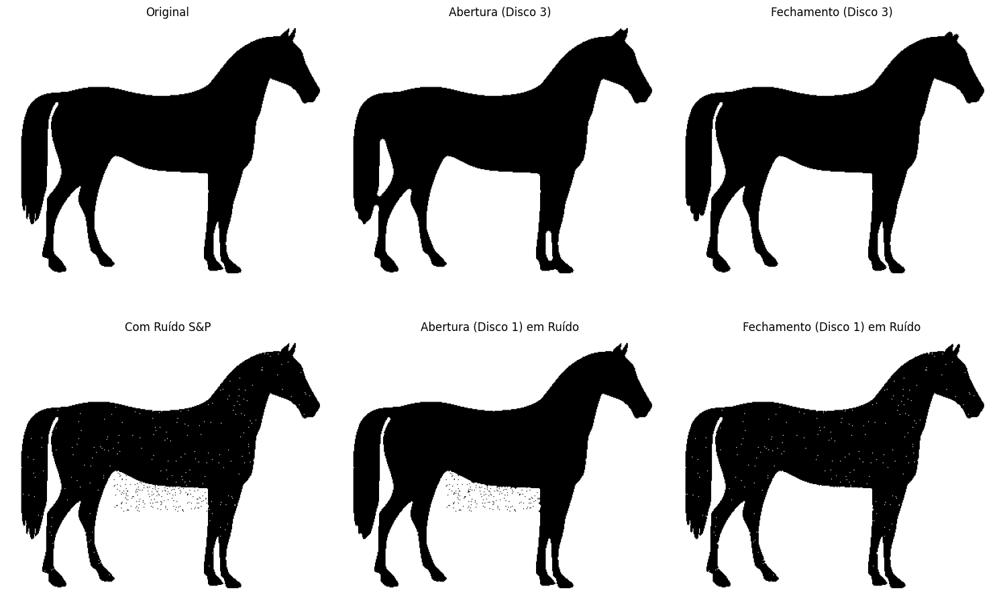

In [ ]:
# 2.2 Abertura e closing binary print("\n--- module 2.2: Abertura e closing Binários ---")  # elements Estruturantes (EE) ee_disco_3_morph = disk(3) # Disco of raio 3 ee_quadrado_5_morph = square(5) # square 5x5  if 'horse_binary' in globals() and 'ee_disco_3_morph' in globals():  # # Abertura  img_abertura_cavalo = binary_opening(horse_binary, footprint=ee_disco_3_morph)   # # closing  img_fechamento_cavalo = binary_closing(horse_binary, footprint=ee_disco_3_morph)   # # create the image with noise to see melhor the effects  horse_com_ruido = horse_binary.copy()  # # add noise "sal" (points brancos)  num_sal = int(0.005 * horse_com_ruido.size)  coords_sal_r = np.random.randint(0, horse_com_ruido.shape[0]-1, num_sal)  coords_sal_c = np.random.randint(0, horse_com_ruido.shape[1]-1, num_sal)  horse_com_ruido[coords_sal_r, coords_sal_c] = True  # # add noise "pimenta" inside of the object (points pretos)  coords_pimenta_r = np.random.randint(horse_com_ruido.shape[0]//3, 2*horse_com_ruido.shape[0]//3, num_sal)  coords_pimenta_c = np.random.randint(horse_com_ruido.shape[1]//3, 2*horse_com_ruido.shape[1]//3, num_sal)  horse_com_ruido[coords_pimenta_r, coords_pimenta_c] = False    img_abertura_ruido = binary_opening(horse_com_ruido, footprint=disk(1)) # EE smaller to noise  img_fechamento_ruido = binary_closing(horse_com_ruido, footprint=disk(1)) # EE smaller to noise    print("Visualizando abertura e closing...")  plot_many_images([horse_binary, img_abertura_cavalo, img_fechamento_cavalo,  horse_com_ruido, img_abertura_ruido, img_fechamento_ruido],  ["Original", "Abertura (Disco 3)", "closing (Disco 3)",  "with Ruído S&P", "Abertura (Disco 1) in Ruído", "closing (Disco 1) in Ruído"],  rows=2, cols=3, cmaps='gray', figsize=(15,10)) else:  print("variables necessárias não definidas. Pule este example.")

Interpretando the results (Abertura and closing):- Abertura: in the original image of the cavalo, the abertura can suavizar the contornos and remove parts very thin. in the image with noise, the abertura should remove the points brancos isolados (noise "sal").- closing: in the original image, the closing can preencher small failures internal. in the image with noise, the closing should preencher the points pretos isolados inside of the object (noise "pimenta").

exercise fast (Abertura and closing)1. Aplique abertura and closing in the image `text_binary` using a `ee = square(2)`. the that acontece?2. Try the sequence: Abertura seguida of closing in the `horse_com_ruido`. and closing seguido of Abertura? the results are different?

2.3. Some algorithms Morfológicos basic

- extraction of edges: Borda = original image XOR image Erodida (or image Dilatada XOR original image).- Preenchimento of Regiões (Hole Filling): Preenche buracos internal in objects binary.- extraction of components Conectados (Labeling): Identifica and rotula objects individual.

the code Funciona:- uses `text_binary` and `horse_binary`.- extraction of Borda: `borda = original ^ erodida`.- Preenchimento of Região: `ndi.binary_fill_holes()`.- components Conectados: `label()` atribui one rótulo integer the each object. `label2rgb()` colore the objects.


--- Módulo 2.3: Algoritmos Morfológicos ---

--- Módulo 2.3: Algoritmos Morfológicos ---
Número de letras (componentes) encontradas: 35
Visualizando algoritmos morfológicos...


<ipython-input-26-626aa9e788f3>:19: FutureWarning: `square` is deprecated since version 0.25 and will be removed in version 0.27. Use `skimage.morphology.footprint_rectangle` instead.
  ee_algos_c9 = square(3) # Elemento estruturante
<ipython-input-26-626aa9e788f3>:47: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colors_for_labels = [plt.cm.get_cmap('prism', num_letras_c9)(i) for i in range(num_letras_c9)]


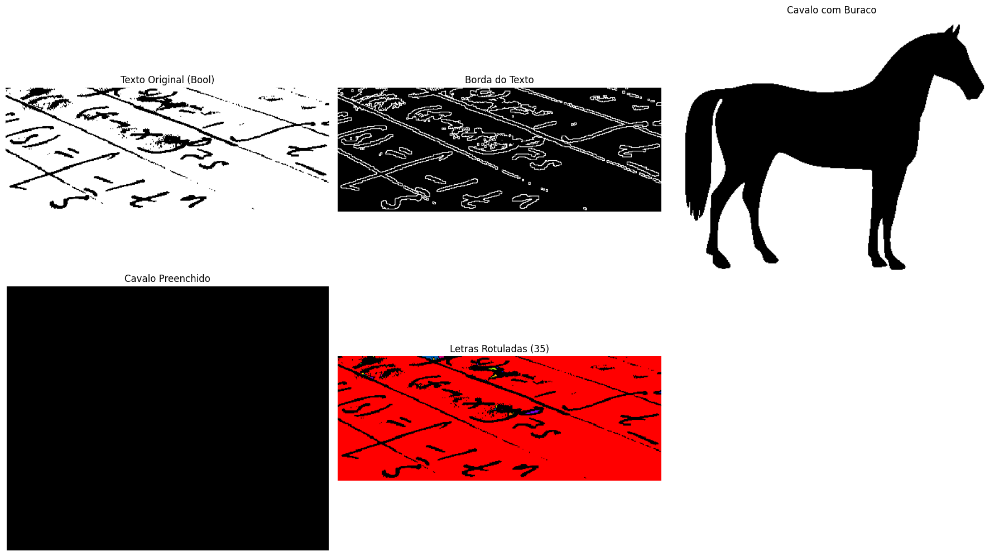

In [ ]:
# 2.3 algorithms Morfológicos basic from scipy import ndimage as ndi print("\n--- module 2.3: algorithms Morfológicos ---")  text_image_sk_g = date.text() # Tons of gray text_binary_g = text_image_sk_g > filters.threshold_otsu(text_image_sk_g)   # 2.3 algorithms Morfológicos basic print("\n--- module 2.3: algorithms Morfológicos ---")  horse_data_g = date.horse() horse_binary_g = img_as_ubyte(horse_data_g) # Converte True/False to 255/0 # to operações morfológicas binary, é melhor that whether True/False or 0/1 horse_binary_bool_g = horse_data_g   if 'text_binary_g' in globals() and 'horse_binary_bool_g' in globals():  ee_algos_c9 = square(3) # element estruturante   # # the) extraction of Borda Morfológica (in the image of text)  text_erodido_borda_c9 = binary_erosion(text_binary_g, footprint=ee_algos_c9)  borda_texto_c9 = text_binary_g ^ text_erodido_borda_c9 # XOR   # # b) Preenchimento of Região (Buracos)  horse_com_buraco_c9 = horse_binary_bool_g.copy()  centro_r_cavalo, centro_c_cavalo = horse_com_buraco_c9.shape[0]//2, horse_com_buraco_c9.shape[1]//2  tamanho_buraco_r, tamanho_buraco_c = 20, 30   r_start_buraco = np.clip(centro_r_cavalo - tamanho_buraco_r // 2, 0, horse_com_buraco_c9.shape[0])  r_end_buraco = np.clip(centro_r_cavalo + tamanho_buraco_r // 2, 0, horse_com_buraco_c9.shape[0])  c_start_buraco = np.clip(centro_c_cavalo - tamanho_buraco_c // 2, 0, horse_com_buraco_c9.shape[1])  c_end_buraco = np.clip(centro_c_cavalo + tamanho_buraco_c // 2, 0, horse_com_buraco_c9.shape[1])   if r_start_buraco < r_end_buraco and c_start_buraco < c_end_buraco :  horse_com_buraco_c9[r_start_buraco:r_end_buraco, c_start_buraco:c_end_buraco] = False   horse_preenchido_c9 = ndi.binary_fill_holes(horse_com_buraco_c9)   # # c) extraction of components Conectados (in the image of text)  labels_letras_c9, num_letras_c9 = label(text_binary_g, connectivity=1, return_num=True)  print(f"number de letras (components) encontradas: {num_letras_c9}")   # # generate colors distinct to the components  if num_letras_c9 > 0:  # # Amostrar the colormap 'prism' to get N colors distinct  colors_for_labels = [plt.cm.get_cmap('prism', num_letras_c9)(i) for i in range(num_letras_c9)]  else:  colors_for_labels = None # Nenhuma color necessária if não houver components   img_letras_coloridas_c9 = label2rgb(labels_letras_c9, bg_label=0, image=None, colors=colors_for_labels)    print("Visualizando algorithms morfológicos...")  plot_many_images([text_binary_g, borda_texto_c9, horse_com_buraco_c9, horse_preenchido_c9, img_letras_coloridas_c9],  ["text Original (Bool)", "Borda of text", "Cavalo with Buraco", "Cavalo Preenchido", f"Letras Rotuladas ({num_letras_c9})"],  rows=2, cols=3, cmaps=['gray','gray','gray','gray', None], figsize=(18,10)) else:  print("images 'text_binary_g' or 'horse_binary_bool_g' não definidas. Pule este example.") 

Interpretando the results (algorithms Morfológicos):- Borda of the text: shows only the contornos of the caracteres.- Cavalo with Buraco / Preenchido: the buraco artificial in the cavalo should be preenchido in the image "Cavalo Preenchido".- Letras Rotuladas: Each letra (or part conectada of the letra) in the image of text should aparecer with the color different, indicating that was identificada the one component separate.exercise fast (algorithms Morfológicos):1. in the extraction of borda, Try use `borda = dilatada ^ original`. the result is different?2. in the `label`, mude `connectivity` to `2` (8-conectividade). This muda the number of components detectados in the image `text_binary`? by quê?

chapter 8 - Compressão of images

concepts important: Redundâncias, Critérios of fidelity, Compressão Lossless vs. Lossy, RLE, Huffman (concept), JPEG (DCT, Quantização).

3.1. foundations of the CompressãoCompressão reduz the quantity of date to represent the image.Redundâncias Exploradas:- Codificação: Símbolos frequent with codes short (Huffman).- Interpixel (spatial): Pixels vizinhos are correlacionados (predição, transforms).- Psicovisual: the olho humano não percebe all information equally (base of the compressão with perdas).

- Compressão Lossless (without Perdas): image reconstruída is idêntica to the original. Ex: PNG, GIF (part), RLE, LZW.- Compressão Lossy (with Perdas): image reconstruída is the approximation. Perde information. Ex: JPEG, GIF (part), MP3.

3.2. methods of Compressão Lossless: RLE and Huffman

- Run-Length Encoding (RLE): Codifica sequences (runs) of values idênticos. Ex: `AAAAABBC` -> `(the,5), (B,2), (C,1)`. Eficaz to images with large áreas uniformes.- Codificação of Huffman: Atribui codes of length variable baseados in the frequency of the símbolos. Símbolos more frequent recebem codes more short. Ótimo to one date set of probabilidades.

the code Funciona (RLE simple):1. the line of the image `text_binary` is usada.2. the code itera by the line, contando sequences of pixels equal.3. Armazena pares `(valor_pixel, contagem_sequencia)`.4. Decodifica to check.


--- Módulo 3.2: Run-Length Encoding (RLE) Simples ---
Linha original (primeiros 50 pixels): [0 0 0 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1]
RLE Codificado (valor, contagem): [(np.False_, 4), (np.True_, 82), (np.False_, 10), (np.True_, 66), (np.False_, 5), (np.True_, 17), (np.False_, 11), (np.True_, 2), (np.False_, 1), (np.True_, 29)]...
RLE Decodificado igual ao original? True


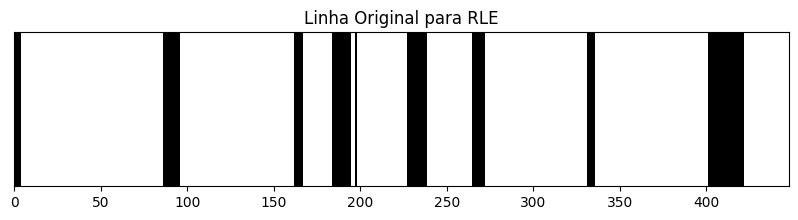

In [ ]:
# 3.2 Run-Length Encoding (RLE) simple print("\n--- module 3.2: Run-Length Encoding (RLE) Simples ---")  if 'text_binary' in globals():  # # get the line of the image of text binary to example  linha_exemplo_rle = text_binary[text_binary.shape[0]//2, :] # line of the middle  print(f"line original (primeiros 50 pixels): {linha_exemplo_rle[:50].astype(int)}")   # # Codificação RLE  rle_codificado = []  if len(linha_exemplo_rle) > 0:  valor_atual = linha_exemplo_rle[0]  contagem_atual = 0  for pixel_val in linha_exemplo_rle:  if pixel_val == valor_atual:  contagem_atual += 1  else:  rle_codificado.append((valor_atual, contagem_atual))  valor_atual = pixel_val  contagem_atual = 1  rle_codificado.append((valor_atual, contagem_atual)) # add the last run   print(f"RLE Codificado (value, contagem): {rle_codificado[:10]}...") # Primeiros 10 runs   # # Decodificação RLE  rle_decodificado_lista = []  for value, contagem in rle_codificado:  rle_decodificado_lista.extend([value] * contagem)  linha_decodificada_rle = np.array(rle_decodificado_lista, dtype=bool)   print(f"RLE Decodificado igual ao original? {np.array_equal(linha_exemplo_rle, linha_decodificada_rle)}")   # # Visualização of the line original  plt.figure(figsize=(10,2))  plt.imshow(linha_exemplo_rle.reshape(1,-1), cmap='gray', aspect='auto', interpolation='nearest')  plt.title("line Original to RLE")  plt.yticks([])  plt.show() else:  print("image 'text_binary' não definida. Pule este example.")

Interpretando the results (RLE):- line original: shows the sequence of pixels brancos and pretos.- RLE Codificado: displays the list of tuplas, where each tupla is `(valor_do_pixel, numero_de_vezes_que_ele_se_repete)`.- verification: Confirma if the line decodificada is idêntica to the original

exercise fast (RLE):1. Try apply the RLE the line of the image `horse_binary`. the RLE is more or less eficaz to this line in comparison with the line of the image of text? by quê?2. Pense in one type of image médica where the RLE could be very eficaz.

3.3. Compressão JPEG (Lossy)

the standard JPEG is the method of compressão with perdas more common to images fotográficas. it uses the transform Cosseno discrete (DCT), seguida of quantização and codificação of entropia.

steps of the JPEG (Simplificado):1. transformation of Espaço of color: (RGB to YCbCr - luminância and crominância).2. Subamostragem of the Crominância: (optional, explora the smaller sensibilidade of the olho humano the details of color).3. division in Blocos: image dividida in blocos 8×8.4. transform DCT: Aplicada the each bloco. Concentra energy in the coeficientes of low frequency.5. Quantização: Coeficientes DCT are divididos by the matrix of quantização and arredondados. this is the main stage with perdas. high frequencies are quantizadas more grosseiramente.6. Codificação of Entropia: Coeficientes quantizados (with verys zeros) are codificados (RLE to zeros, Huffman/Aritmética to não nulos).

the code Funciona (demonstration with Pillow/PIL):1. uses `img_para_compressao` (the image of the astronauta).2. save with different qualities JPEG: the library Pillow (PIL) saves the JPEG with one parameter `quality` (1-95 or 1-100). quality smaller = larger compressão (more perdas).3. compare sizes and visualize: saves with high and low quality, verifica the sizes of the files and loads of return for visualization.


--- Módulo 3.3: Compressão JPEG ---
Salvo como 'img_jpeg_alta_q.jpg' com Q=90, Tamanho: 64.9 KB
Salvo como 'img_jpeg_media_q.jpg' com Q=50, Tamanho: 26.5 KB
Salvo como 'img_jpeg_baixa_q.jpg' com Q=10, Tamanho: 9.5 KB

Visualizando resultados da compressão JPEG...


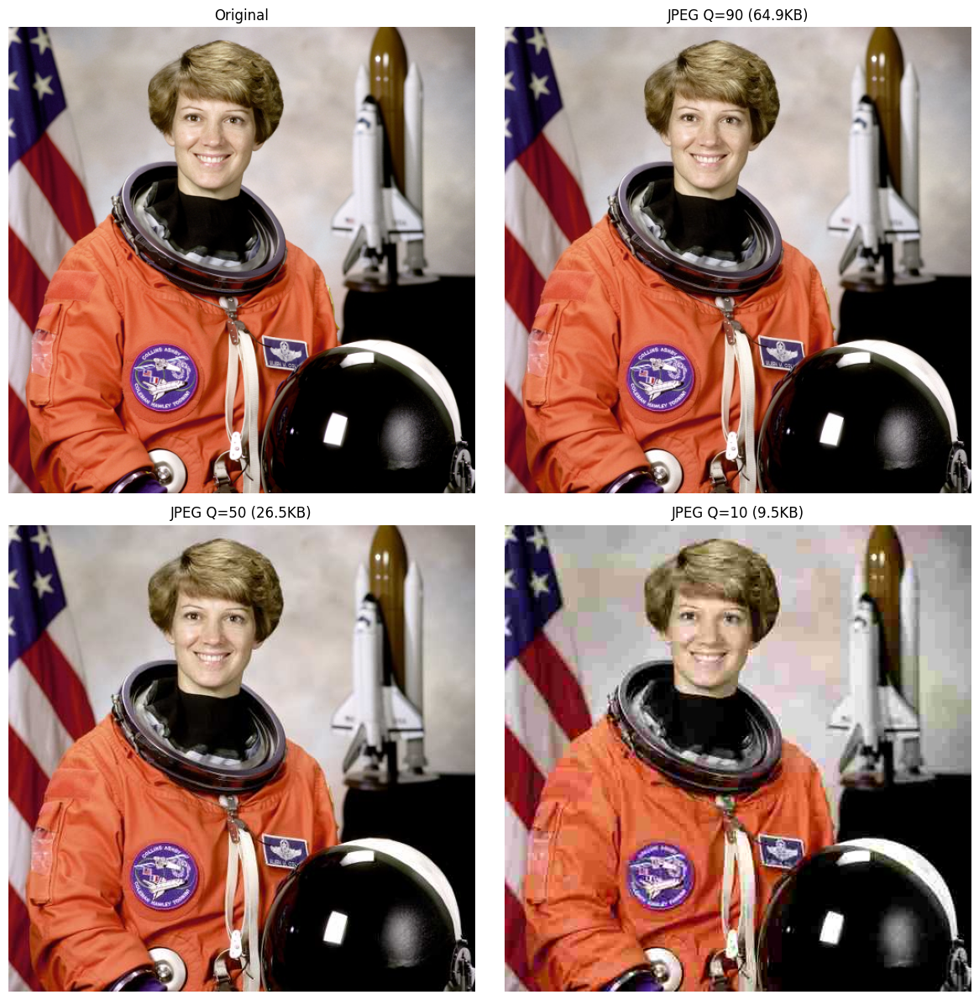

In [ ]:
# 3.3 Compressão JPEG (Lossy) using Pillow print("\n--- module 3.3: Compressão JPEG ---")  img_para_compressao = astro_color.copy()  if 'img_para_compressao' in globals():  # # convert image of the skimage (numpy array) to object Image of the Pillow  if img_para_compressao.dtype == np.float64 or img_para_compressao.dtype == np.float32:  img_pil_original_jpeg = Image.fromarray(img_as_ubyte(img_para_compressao))  else: # Assume that already é ubyte  img_pil_original_jpeg = Image.fromarray(img_para_compressao)   # # save with high quality  qualidade_alta_jpeg = 90  arquivo_jpeg_alta_q_aula = "img_jpeg_alta_q.jpg"  img_pil_original_jpeg.save(arquivo_jpeg_alta_q_aula, quality=qualidade_alta_jpeg, optimize=True)  tamanho_alta_q_aula = os.path.getsize(arquivo_jpeg_alta_q_aula)  print(f"Salvo as '{arquivo_jpeg_alta_q_aula}' with Q={qualidade_alta_jpeg}, size: {tamanho_alta_q_aula/1024:.1f} KB")   # # save with average quality  qualidade_media_jpeg = 50  arquivo_jpeg_media_q_aula = "img_jpeg_media_q.jpg"  img_pil_original_jpeg.save(arquivo_jpeg_media_q_aula, quality=qualidade_media_jpeg, optimize=True)  tamanho_media_q_aula = os.path.getsize(arquivo_jpeg_media_q_aula)  print(f"Salvo as '{arquivo_jpeg_media_q_aula}' with Q={qualidade_media_jpeg}, size: {tamanho_media_q_aula/1024:.1f} KB")   # # save with low quality  qualidade_baixa_jpeg = 10  arquivo_jpeg_baixa_q_aula = "img_jpeg_baixa_q.jpg"  img_pil_original_jpeg.save(arquivo_jpeg_baixa_q_aula, quality=qualidade_baixa_jpeg, optimize=True)  tamanho_baixa_q_aula = os.path.getsize(arquivo_jpeg_baixa_q_aula)  print(f"Salvo as '{arquivo_jpeg_baixa_q_aula}' with Q={qualidade_baixa_jpeg}, size: {tamanho_baixa_q_aula/1024:.1f} KB")   # # load the images salvas for visualization  img_jpeg_alta_q_loaded_aula = np.array(Image.open(arquivo_jpeg_alta_q_aula))  img_jpeg_media_q_loaded_aula = np.array(Image.open(arquivo_jpeg_media_q_aula))  img_jpeg_baixa_q_loaded_aula = np.array(Image.open(arquivo_jpeg_baixa_q_aula))   print("\nVisualizando results of compressão JPEG...")  plot_many_images([img_para_compressao, img_jpeg_alta_q_loaded_aula, img_jpeg_media_q_loaded_aula, img_jpeg_baixa_q_loaded_aula],  ["Original", f"JPEG Q={qualidade_alta_jpeg} ({tamanho_alta_q_aula/1024:.1f}KB)",  f"JPEG Q={qualidade_media_jpeg} ({tamanho_media_q_aula/1024:.1f}KB)",f"JPEG Q={qualidade_baixa_jpeg} ({tamanho_baixa_q_aula/1024:.1f}KB)"],  rows=2, cols=2, cmaps=[None]*4, figsize=(12,12)) else:  print("image 'img_para_compressao' não carregada. Pule este example.")

Interpretando the results (JPEG):- sizes of the files: Compare the sizes. the compressão with `quality=10` should resultar in one file significativamente smaller that `quality=90`.- quality Visual:- `quality=90`: the image should opinion very next of the original, with poucos or nenhuns artifacts visible.- `quality=50`: Some artifacts can start the aparecer, especially in regiões of high frequency or transições of color smooth.- `quality=10`: the image probably will show artifacts JPEG pronunciados:- Blocking: standards of blocos 8×8 visible.- Ringing/Mosquito Noise: "Fantasmas" or ondulações in torno of edges nítidas.- Perda of thin details and texturas.exercise fast (JPEG):1. choice one value of `quality` intermediate (ex: 30, 70) and observe the result.2. to images médicas, the compressão with perdas the JPEG is generally aceitável? Quais are the preocupações? (tip: perda of details diagnósticos sutis). to arquivamento or telemedicina, quais standards are more common and by quê (ex: DICOM with options lossless or lossy controladas the JPEG2000)?